In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import dandelion as ddl
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sc.logging.print_versions()

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/NC_study/scanpy'))

# create a palette for umap
import sys
sys.path.append('/home/jovyan/NC_study/scanpy/scripts')
from tools import cmp
newcmp = cmp()

scanpy==1.5.1 anndata==0.7.4 umap==0.4.6 numpy==1.19.1 scipy==1.5.2 pandas==1.0.5 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.2 leidenalg==0.8.1


In [2]:
adata = sc.read_h5ad('out/adata_combined_v2.h5ad')
adata_raw = sc.read_h5ad('out/adata_combined_raw_v2.h5ad')
adata

AnnData object with n_obs × n_vars = 93971 × 876
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'temp_label'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

### Check cluster positions again

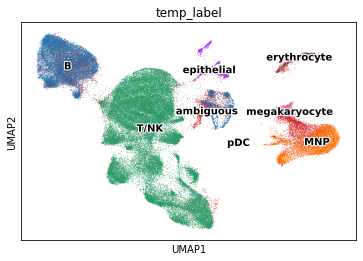

In [3]:
sc.pl.umap(adata, color = ['temp_label'], legend_loc = 'on data', legend_fontoutline=2)

### Filter out ambiguous

In [4]:
adata = adata[~(adata.obs['temp_label']=='ambiguous')]
adata_raw = adata_raw[~(adata_raw.obs['temp_label']=='ambiguous')]
adata

View of AnnData object with n_obs × n_vars = 80873 × 876
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'temp_label'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

### Recluster

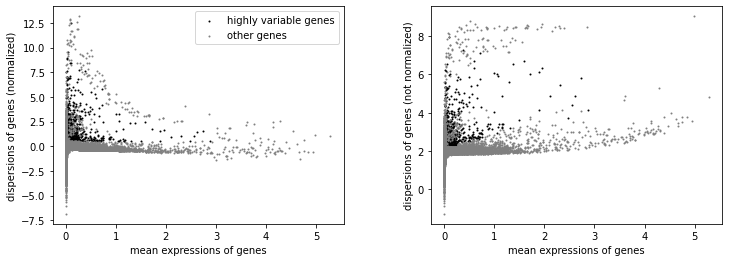

AnnData object with n_obs × n_vars = 80873 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'temp_label'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'umap'
    obsm: 'X_pca', 'X_umap'

In [5]:
adata = adata.raw.to_adata()
sc.pp.highly_variable_genes(adata, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
import re
for i in adata.var.index:
    if re.search('^TR[AB][VDJ]|^IG[HKL][VDJ]', i):
        adata.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(adata)
adata.raw = adata
adata

In [6]:
# subset to highly variable
adata = adata[:, adata.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])
sc.pp.scale(adata, max_value = 10)

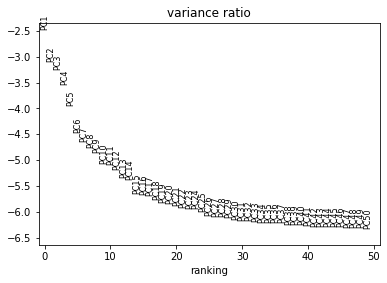

In [7]:
# Principal component analysis
sc.tl.pca(adata, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(adata, log = True, n_pcs = 50)

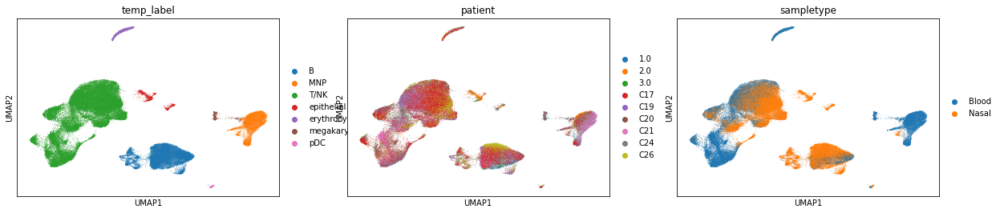

In [8]:
# run BBKNN
sc.external.pp.bbknn(adata, batch_key = 'patient')
# UMAP
sc.tl.umap(adata, n_components = 2, min_dist = 0.3)
sc.pl.umap(adata, color=['temp_label', 'patient', 'sampletype'])

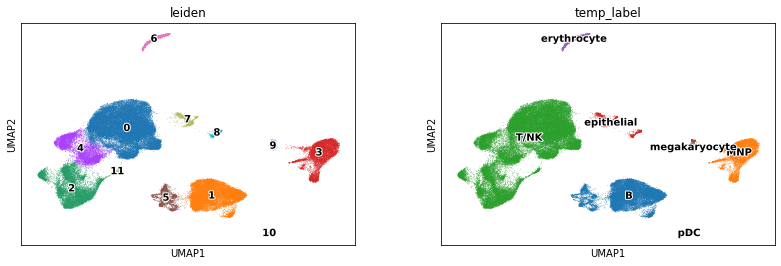

In [10]:
# find clusters
sc.tl.leiden(adata, resolution = .3)
sc.pl.umap(adata, color=['leiden', 'temp_label'], legend_loc ='on data', legend_fontoutline=2)

## Sub-clustering for fine cell type annotation

### MNP

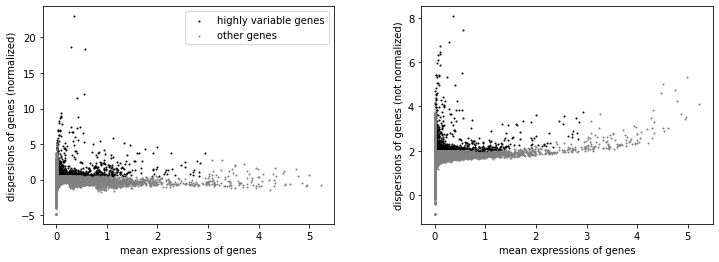

AnnData object with n_obs × n_vars = 7723 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'temp_label'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'umap', 'temp_label_colors'
    obsm: 'X_pca', 'X_umap'

In [112]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['3'])]
rna_x = rna_.raw.to_adata()
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

In [113]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

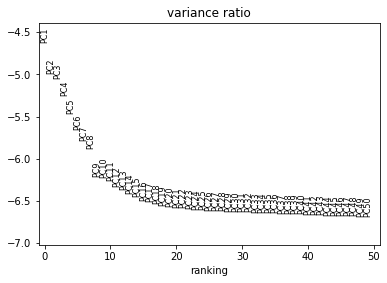

In [114]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

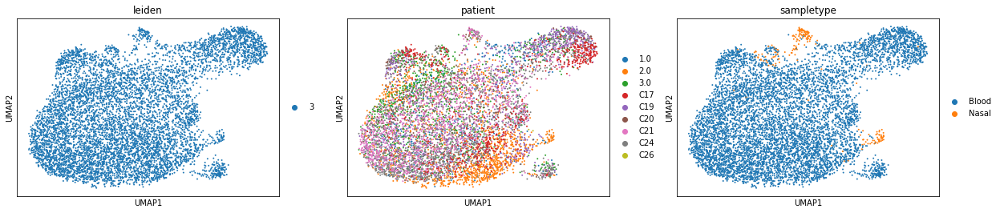

In [115]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient')
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'])

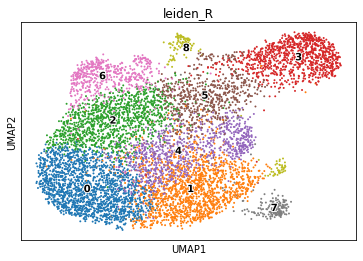

In [116]:
# find clusters
sc.tl.leiden(rna_x, resolution = 1, key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden_R'], legend_loc ='on data', legend_fontoutline=2)

In [117]:
# create a palette for umap
import sys
sys.path.append('/home/jovyan/NC_study/scanpy/scripts')
from tools import cmp
newcmp = cmp()

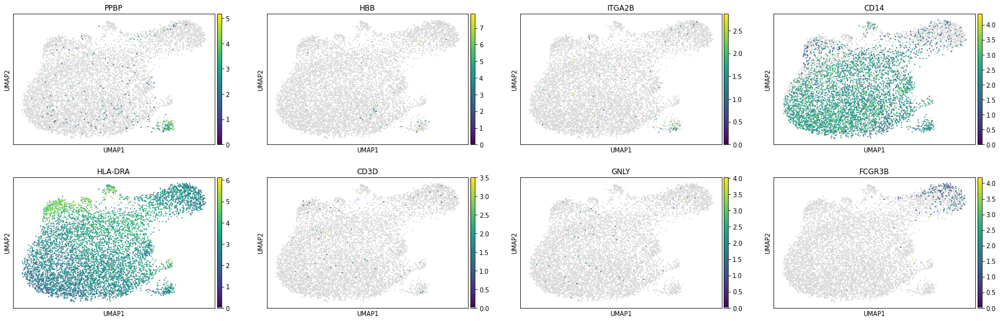

In [118]:
sc.pl.umap(rna_x, color = ['PPBP', 'HBB', 'ITGA2B', 'CD14', 'HLA-DRA', 'CD3D', 'GNLY', 'FCGR3B'], color_map = newcmp)

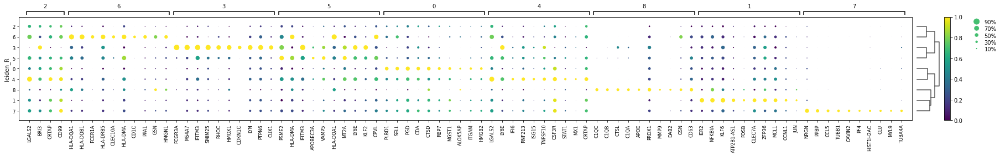

In [119]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

... storing 'temp_label' as categorical


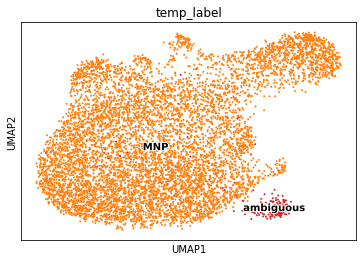

In [120]:
new_dict1 = {'0':'MNP',
             '1':'MNP',
             '2':'MNP',
             '3':'MNP',
             '4':'MNP',
             '5':'MNP',
             '6':'MNP',
             '7':'ambiguous',
             '8':'MNP'}
rna_x.obs['temp_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['temp_label'], legend_loc ='on data', legend_fontoutline=2)

... storing 'temp_label' as categorical


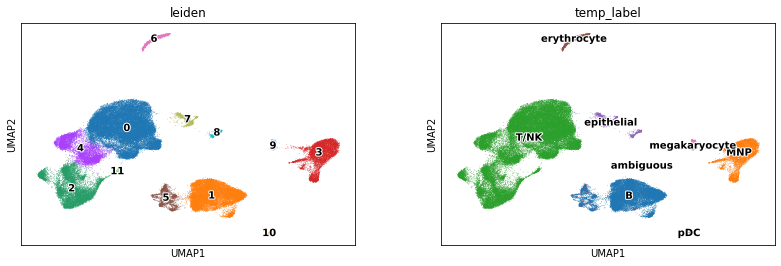

In [121]:
# update the original object
adata.obs['temp_label'] = adata.obs['temp_label'].astype('object')
adata.obs['temp_label'].update(rna_x.obs['temp_label'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'temp_label'], legend_loc = 'on data', legend_fontoutline=2)

### NK cell/T cell

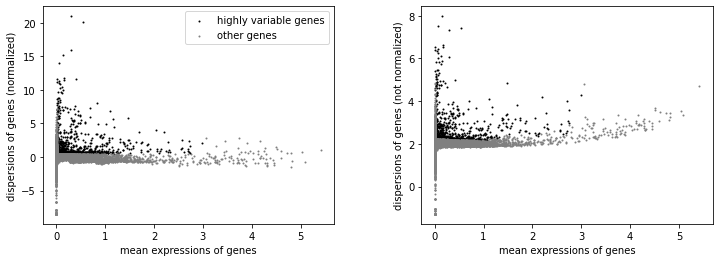

AnnData object with n_obs × n_vars = 50598 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'temp_label'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'umap', 'temp_label_colors'
    obsm: 'X_pca', 'X_umap'

In [122]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['2', '11', '4', '0'])]
rna_x = rna_.raw.to_adata()
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# import re
# for i in rna_x.var.index:
#     if re.search('^TR[AB][VDJ]', i):
#         rna_x.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(rna_x)
rna_x

In [123]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

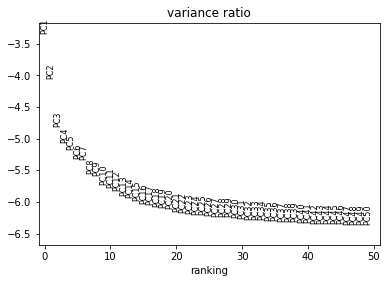

In [124]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

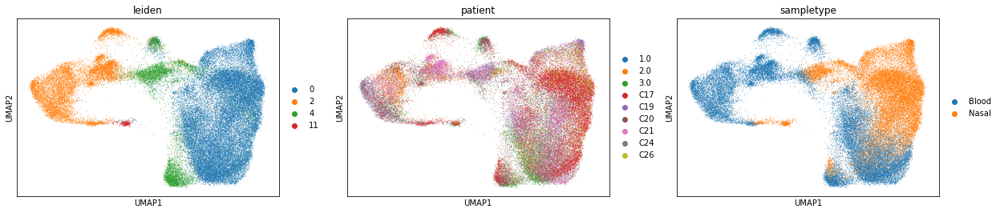

In [125]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient')
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'])

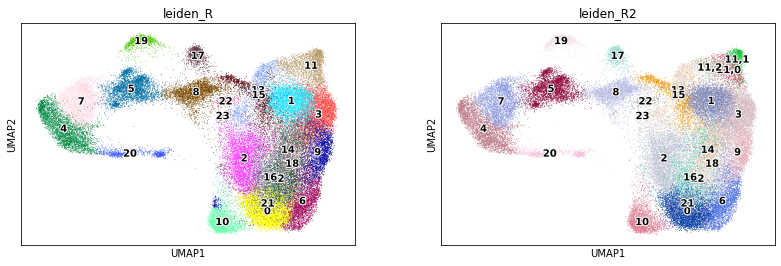

In [136]:
# find clusters
sc.tl.leiden(rna_x, key_added = 'leiden_R', resolution = 2)
sc.tl.leiden(rna_x, key_added = 'leiden_R2', restrict_to = ('leiden_R', ['11']), resolution = .5)
sc.pl.umap(rna_x, color=['leiden_R', 'leiden_R2'], legend_loc ='on data', legend_fontoutline=2)

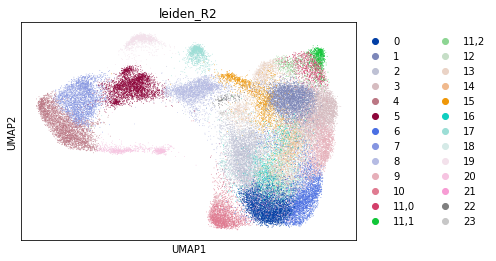

In [140]:
sc.pl.umap(rna_x, color=['leiden_R2'])

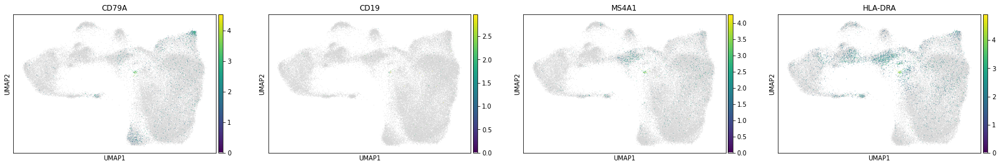

In [132]:
sc.pl.umap(rna_x, color=['CD79A', 'CD19', 'MS4A1', 'HLA-DRA'], color_map = newcmp)

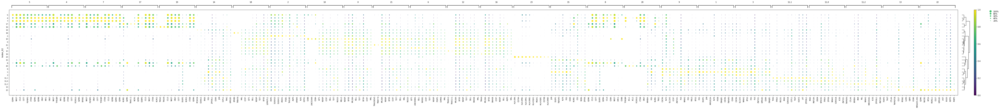

In [139]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R2', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R2')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

... storing 'temp_label' as categorical


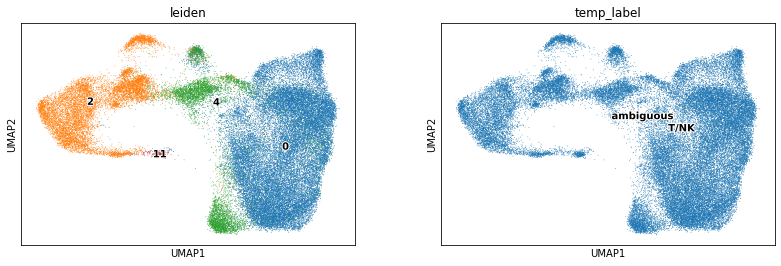

In [141]:
new_dict1 = {
'0':'T/NK',
'1':'T/NK',
'2':'T/NK',
'3':'T/NK',
'4':'T/NK',
'5':'T/NK',
'6':'T/NK',
'7':'T/NK',
'8':'T/NK',
'9':'T/NK',
'10':'T/NK',
'11':'T/NK',
'12':'T/NK',
'13':'T/NK',
'14':'T/NK',
'15':'T/NK',
'16':'T/NK',
'17':'T/NK',
'18':'T/NK',
'19':'T/NK',
'20':'T/NK',
'21':'T/NK',
'22':'T/NK',
'23':'ambiguous'
}
rna_x.obs['temp_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'temp_label'], legend_loc ='on data', legend_fontoutline=2)

... storing 'temp_label' as categorical


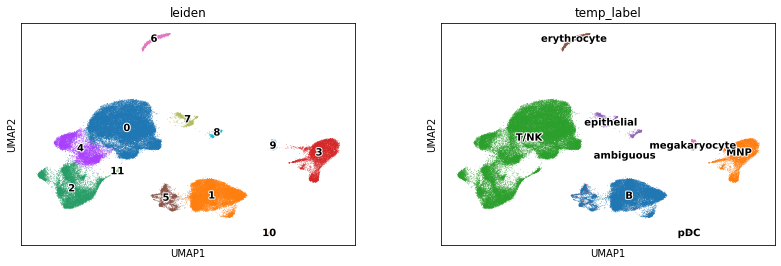

In [142]:
# update the original object
adata.obs['temp_label'] = adata.obs['temp_label'].astype('object')
adata.obs['temp_label'].update(rna_x.obs['temp_label'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'temp_label'], legend_loc = 'on data', legend_fontoutline=2)

### pDC

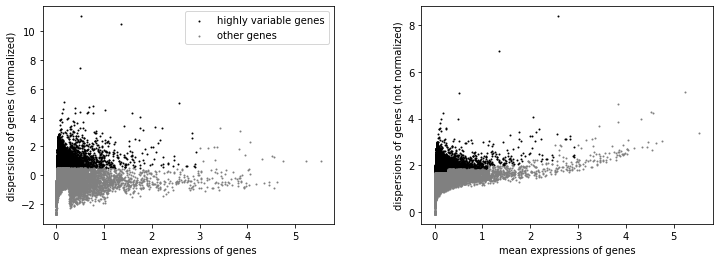

AnnData object with n_obs × n_vars = 361 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'temp_label'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'umap', 'temp_label_colors'
    obsm: 'X_pca', 'X_umap'

In [143]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['10'])]
rna_x = rna_.raw.to_adata()
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

In [144]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

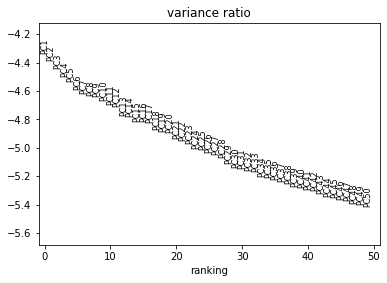

In [145]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

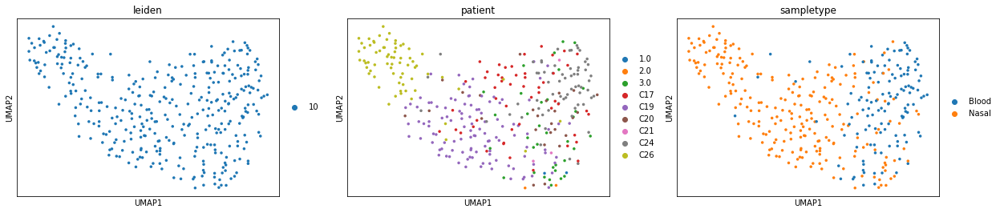

In [146]:
# run BBKNN
# sc.external.pp.bbknn(rna_x, batch_key = 'patient')
sc.pp.neighbors(rna_x)
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'], size=50)

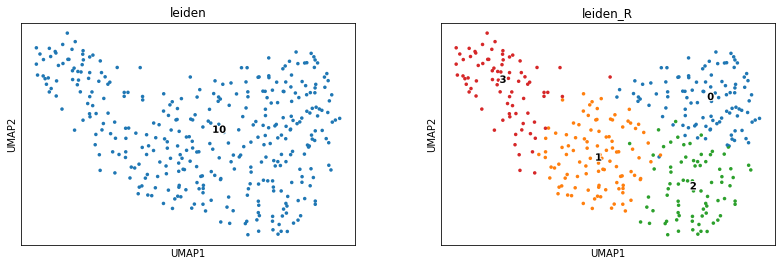

In [147]:
# find clusters
sc.tl.leiden(rna_x, resolution = 1, key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=50, legend_loc ='on data', legend_fontoutline=2)

... storing 'temp_label' as categorical


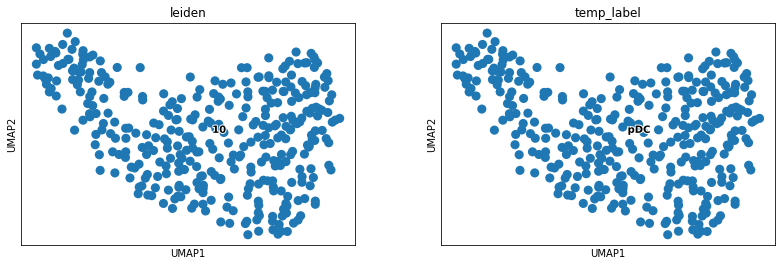

In [148]:
new_dict1 = {
'0':'pDC',
'1':'pDC',
'2':'pDC',
'3':'pDC'
}
rna_x.obs['temp_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'temp_label'], legend_loc ='on data', legend_fontoutline=2)

... storing 'temp_label' as categorical


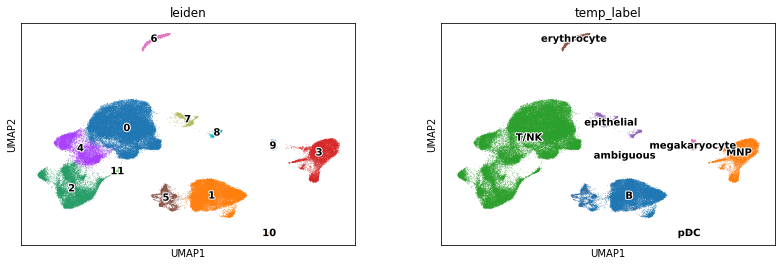

In [149]:
# update the original object
adata.obs['temp_label'] = adata.obs['temp_label'].astype('object')
adata.obs['temp_label'].update(rna_x.obs['temp_label'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'temp_label'], legend_loc = 'on data', legend_fontoutline=2)

### B cells

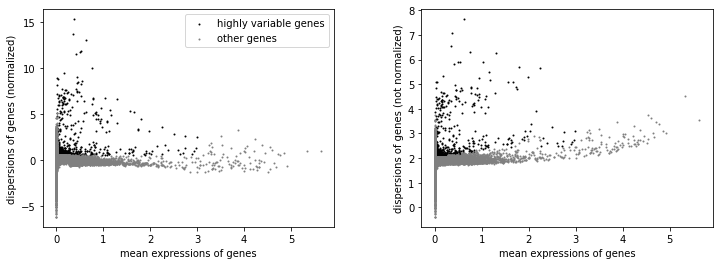

AnnData object with n_obs × n_vars = 16129 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'temp_label'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'umap', 'temp_label_colors'
    obsm: 'X_pca', 'X_umap'

In [150]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['1'])]
rna_x = rna_.raw.to_adata()
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

In [151]:
# ## remove IGHV/IGLV/IGKV D and J genes from the highly variable genes
# import re
# for i in rna_x.var.index:
#     if re.search('^IG[HKL][VDJ]', i):
#         rna_x.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rna_x)

In [152]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

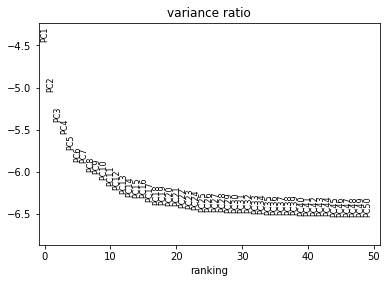

In [153]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

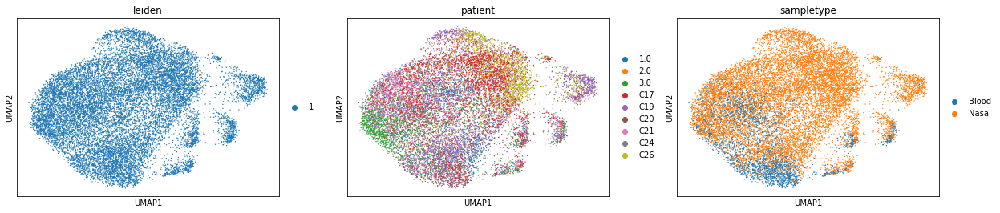

In [154]:
# # run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient')
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'])

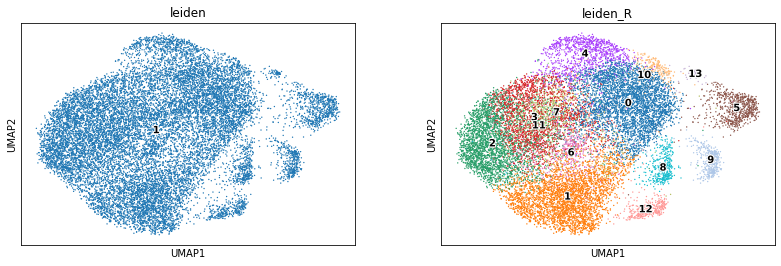

In [155]:
# find clusters
sc.tl.leiden(rna_x, key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], legend_loc ='on data', legend_fontoutline=2)

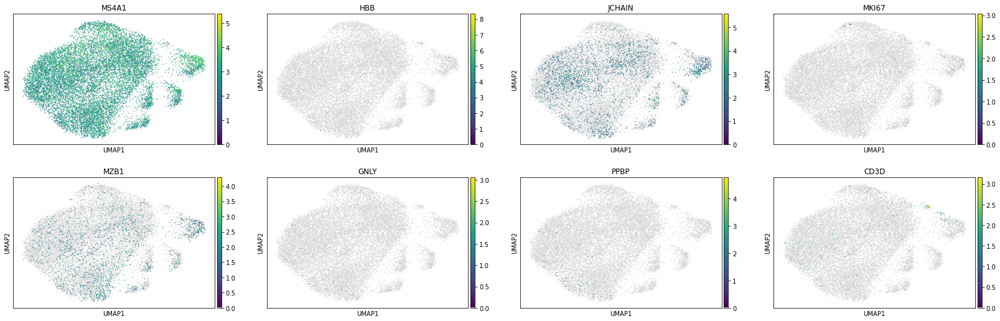

In [156]:
sc.pl.umap(rna_x, color = ['MS4A1', 'HBB', 'JCHAIN', 'MKI67', 'MZB1', 'GNLY', 'PPBP', 'CD3D'], color_map = newcmp)

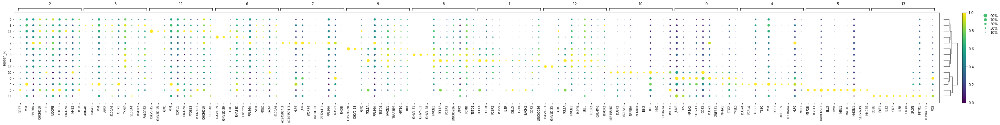

In [157]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

... storing 'temp_label' as categorical


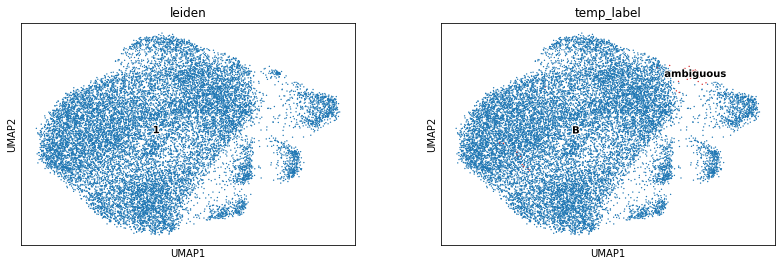

In [158]:
new_dict1 = {
'0':'B',
'1':'B',
'2':'B',
'3':'B',
'4':'B',
'5':'B',
'6':'B',
'7':'B',
'8':'B',
'9':'B',
'10':'B',
'11':'B',
'12':'B',
'13':'ambiguous'
}
rna_x.obs['temp_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'temp_label'], legend_loc ='on data', legend_fontoutline=2)

... storing 'temp_label' as categorical


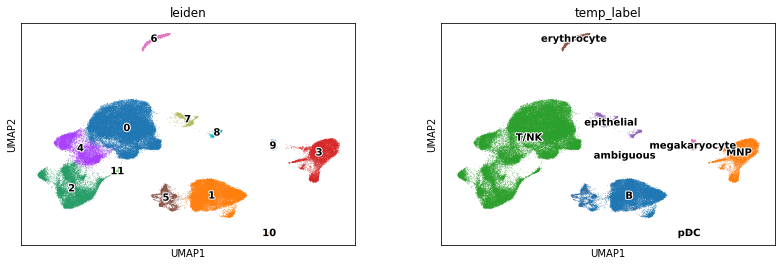

In [159]:
# update the original object
adata.obs['temp_label'] = adata.obs['temp_label'].astype('object')
adata.obs['temp_label'].update(rna_x.obs['temp_label'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'temp_label'], legend_loc = 'on data', legend_fontoutline=2)

### plasma cells

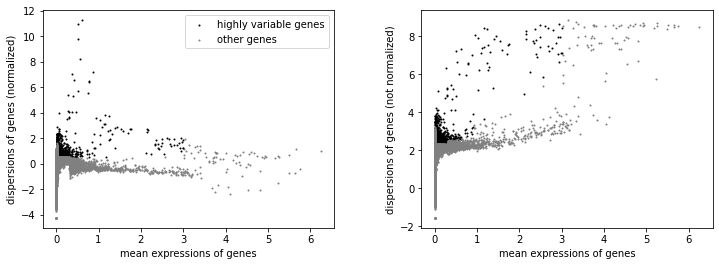

AnnData object with n_obs × n_vars = 2242 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'temp_label'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'umap', 'temp_label_colors'
    obsm: 'X_pca', 'X_umap'

In [160]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['5'])]
rna_x = rna_.raw.to_adata()
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

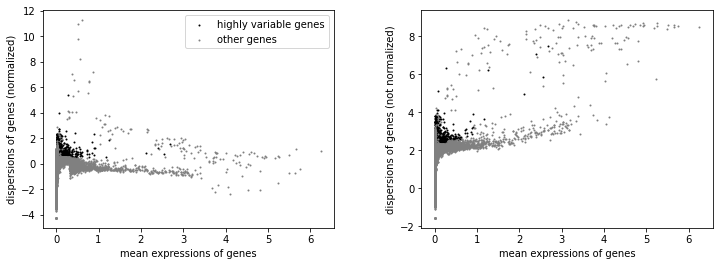

In [161]:
## remove IGHV/IGLV/IGKV D and J genes from the highly variable genes
import re
for i in rna_x.var.index:
    if re.search('^IG[HKL][VDJ]', i):
        rna_x.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(rna_x)

In [162]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

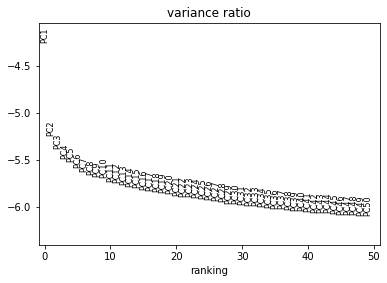

In [163]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

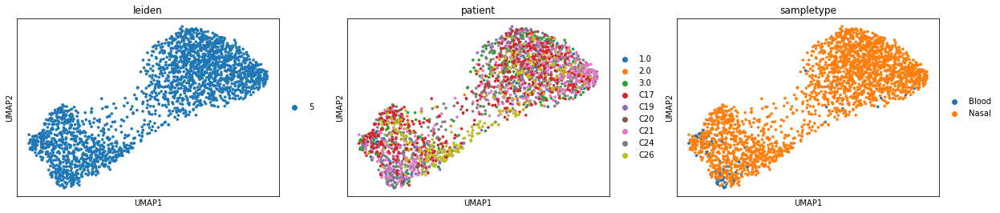

In [164]:
# # run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient')
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'])

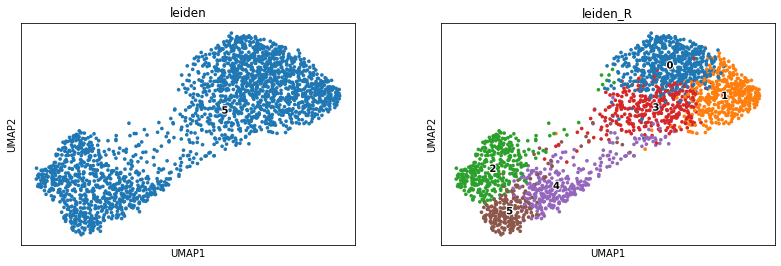

In [165]:
# find clusters
sc.tl.leiden(rna_x, key_added = 'leiden_R', resolution = 1)
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], legend_loc ='on data', legend_fontoutline=2)

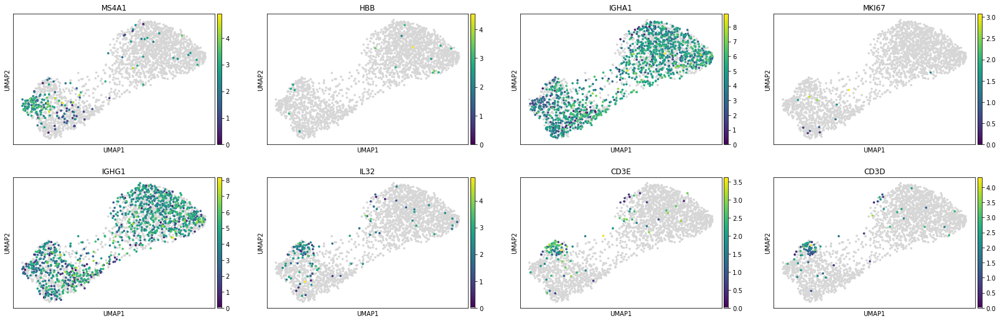

In [166]:
sc.pl.umap(rna_x, color = ['MS4A1', 'HBB', 'IGHA1', 'MKI67', 'IGHG1', 'IL32', 'CD3E', 'CD3D'], color_map = newcmp)

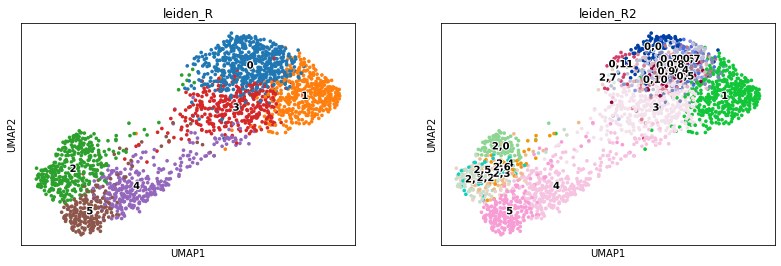

In [167]:
sc.tl.leiden(rna_x, key_added = 'leiden_R2', resolution = 1, restrict_to = ('leiden_R', ['2']))
sc.tl.leiden(rna_x, key_added = 'leiden_R2', resolution = 1, restrict_to = ('leiden_R2', ['0']))
sc.pl.umap(rna_x, color=['leiden_R', 'leiden_R2'], legend_loc ='on data', legend_fontoutline=2)

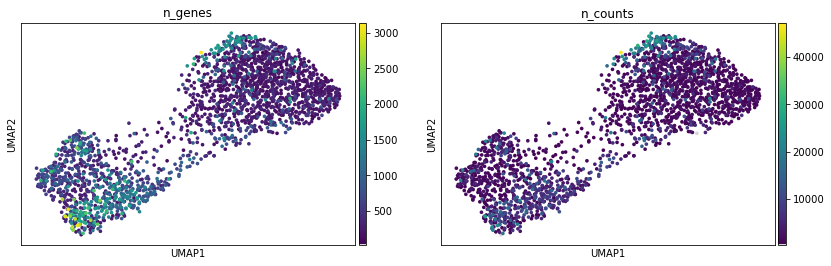

In [168]:
sc.pl.umap(rna_x, color = ['n_genes', 'n_counts'], color_map = newcmp)

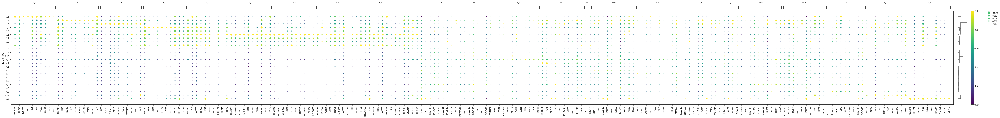

In [169]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R2', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R2')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

... storing 'temp_label' as categorical


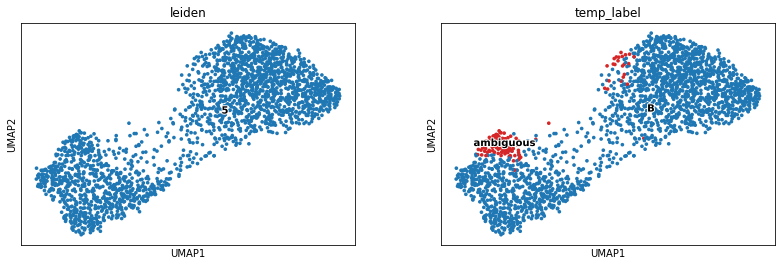

In [170]:
new_dict1 = {
'0,0':'B',
'0,1':'B',
'0,2':'B',
'0,3':'B',
'0,4':'B',
'0,5':'B',
'0,6':'B',
'0,7':'B',
'0,8':'B',
'0,9':'B',
'0,10':'B',
'0,11':'ambiguous',
'1':'B',
'2,0':'ambiguous',
'2,1':'B',
'2,2':'B',
'2,3':'B',
'2,4':'B',
'2,5':'B',
'2,6':'B',
'2,7':'B',
'3':'B',
'4':'B',
'5':'B',
'6':'B',
'7':'B',
'8':'B',
'9':'B',
'10':'B',
'11':'B'
}
rna_x.obs['temp_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R2']]
sc.pl.umap(rna_x, color=['leiden', 'temp_label'], legend_loc ='on data', legend_fontoutline=2)

... storing 'temp_label' as categorical


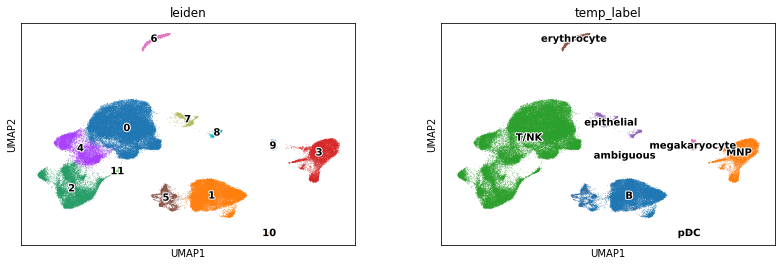

In [171]:
# update the original object
adata.obs['temp_label'] = adata.obs['temp_label'].astype('object')
adata.obs['temp_label'].update(rna_x.obs['temp_label'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'temp_label'], legend_loc = 'on data', legend_fontoutline=2)

### B and plasma cells round 2

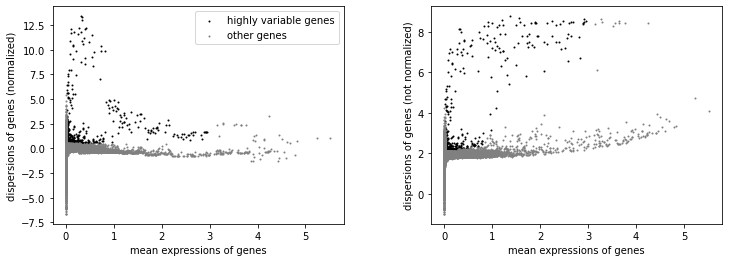

AnnData object with n_obs × n_vars = 18170 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'temp_label'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'umap', 'temp_label_colors'
    obsm: 'X_pca', 'X_umap'

In [172]:
# subset
rna_ = adata[(adata.obs['leiden'].isin(['1', '5'])) & (adata.obs['temp_label'].isin(['B']))]
rna_x = rna_.raw.to_adata()
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

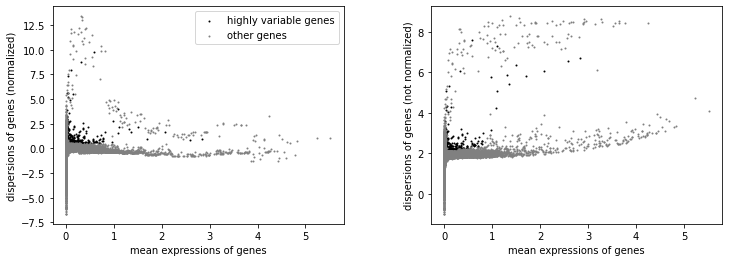

In [173]:
## remove IGHV/IGLV/IGKV D and J genes from the highly variable genes
import re
for i in rna_x.var.index:
    if re.search('^IG[HKL][VDJ]', i):
        rna_x.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(rna_x)

In [174]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

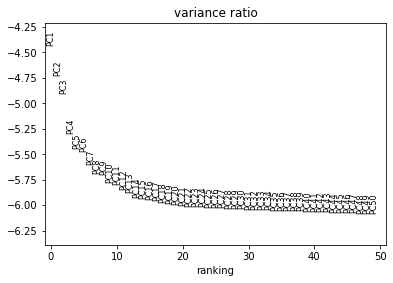

In [175]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

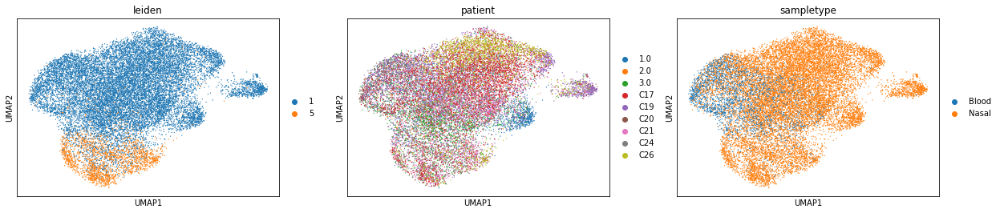

In [176]:
# # run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient')
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'])

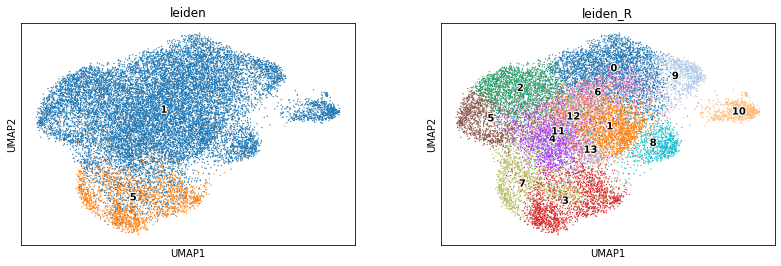

In [177]:
# find clusters
sc.tl.leiden(rna_x, key_added = 'leiden_R', resolution = 1)
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], legend_loc ='on data', legend_fontoutline=2)

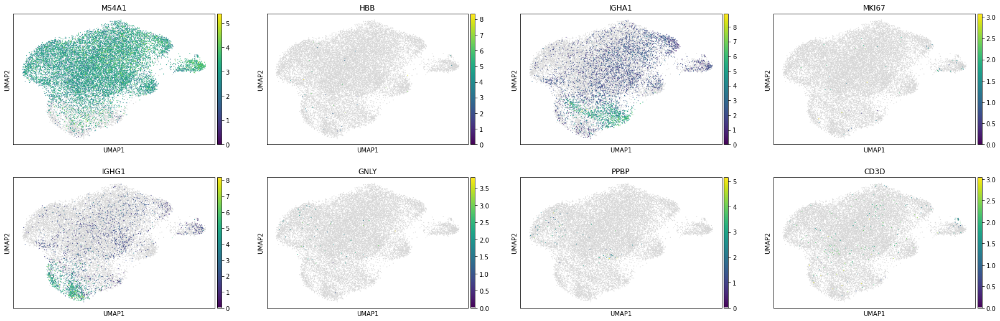

In [178]:
sc.pl.umap(rna_x, color = ['MS4A1', 'HBB', 'IGHA1', 'MKI67', 'IGHG1', 'GNLY', 'PPBP', 'CD3D'], color_map = newcmp)

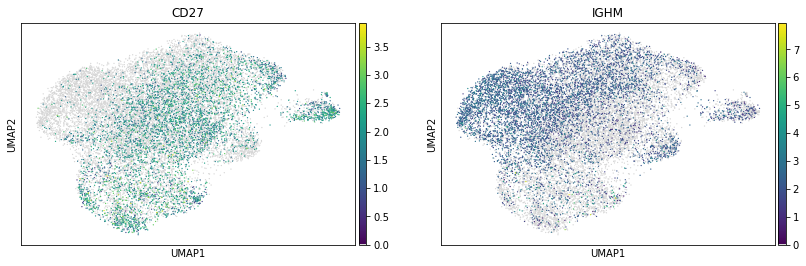

In [185]:
sc.pl.umap(rna_x, color = ['CD27', 'IGHM', 'IGHA1', 'IGHA2', 'IGHD'], color_map = newcmp)

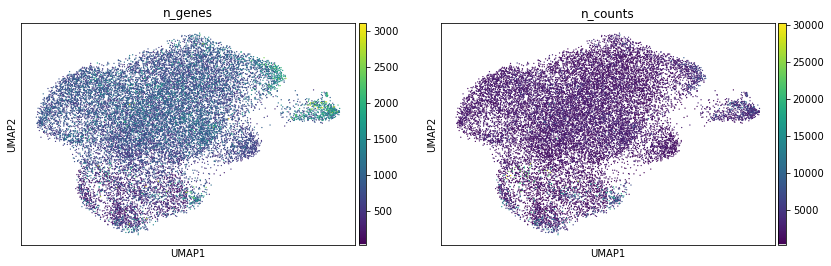

In [179]:
sc.pl.umap(rna_x, color = ['n_genes', 'n_counts'], color_map = newcmp)

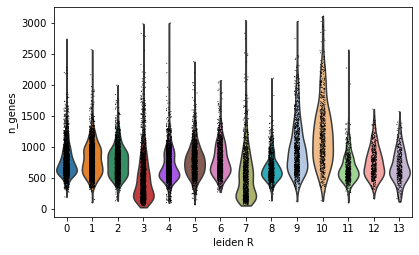

In [212]:
sc.pl.violin(rna_x, ['n_genes'], groupby = 'leiden_R', color_map = newcmp)

In [202]:
rna_x.raw[:, rna_x.raw.var.index.str.contains('^VPREB|^IGLL')].var

,gene_ids,feature_types,n_cells,highly_variable,means,dispersions,dispersions_norm
VPREB1,ENSG00000169575,Gene Expression,40,False,0.002219,2.022954,0.070389
IGLL5,ENSG00000254709,Gene Expression,3651,True,0.375733,4.288558,3.173140
IGLL1,ENSG00000128322,Gene Expression,17,False,0.001638,3.578124,3.328499
VPREB3,ENSG00000128218,Gene Expression,10055,False,0.676499,2.575974,0.429927


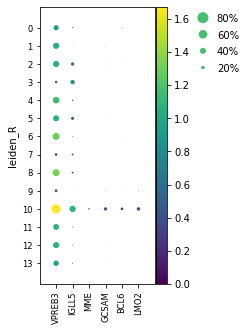

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[2.0999999999999996, 0, 0.2, 0.5, 0.25])

In [210]:
sc.pl.dotplot(rna_x, ['VPREB3','IGLL5','MME', 'GCSAM', 'BCL6', 'LMO2'], groupby = 'leiden_R', color_map ='viridis')

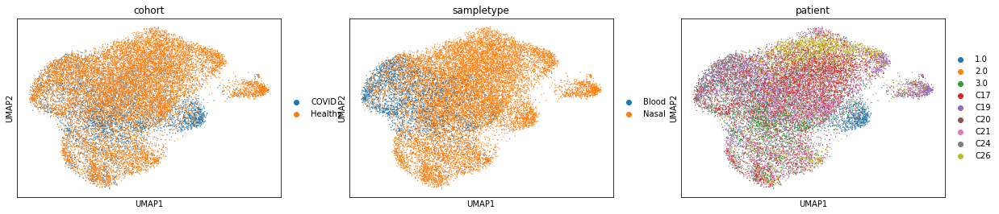

In [213]:
sc.pl.umap(rna_x, color= ['cohort', 'sampletype', 'patient'])

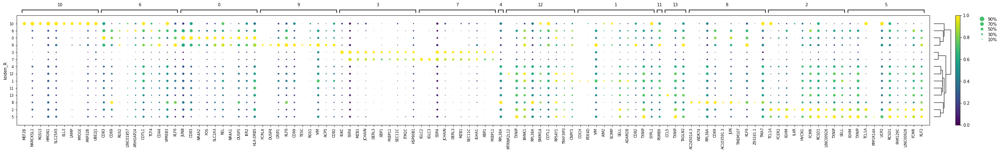

In [181]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

... storing 'temp_label' as categorical


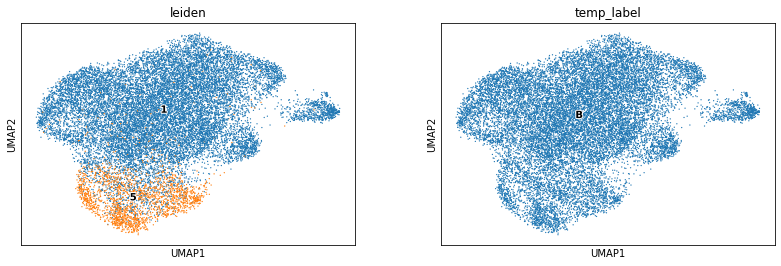

In [214]:
new_dict1 = {
'0':'B',
'1':'B',
'2':'B',
'3':'B',
'4':'B',
'5':'B',
'6':'B',
'7':'B',
'8':'B',
'9':'B',
'10':'B',
'11':'B',
'12':'B',
'13':'B'
}
rna_x.obs['temp_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'temp_label'], legend_loc ='on data', legend_fontoutline=2)

... storing 'temp_label' as categorical


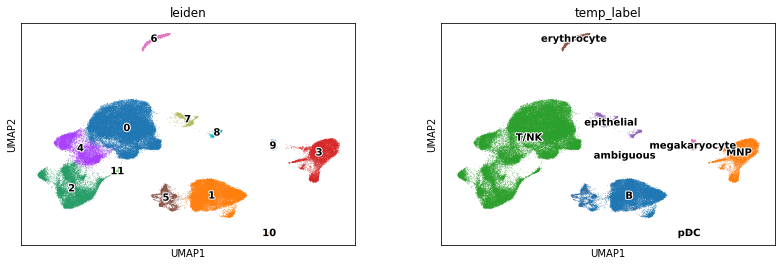

In [215]:
# update the original object
adata.obs['temp_label'] = adata.obs['temp_label'].astype('object')
adata.obs['temp_label'].update(rna_x.obs['temp_label'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'temp_label'], legend_loc = 'on data', legend_fontoutline=2)

### Megakaryocyte and erythrocyte

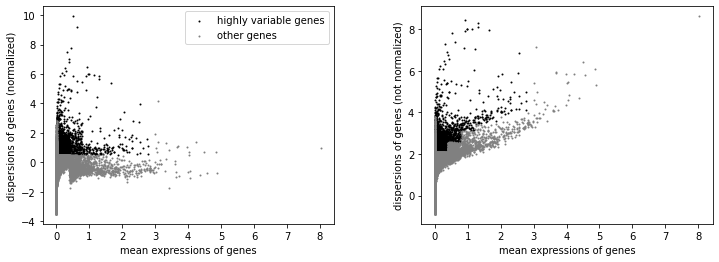

AnnData object with n_obs × n_vars = 3820 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'temp_label'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'umap', 'temp_label_colors'
    obsm: 'X_pca', 'X_umap'

In [230]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['6', '7', '8', '9'])]
rna_x = rna_.raw.to_adata()
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

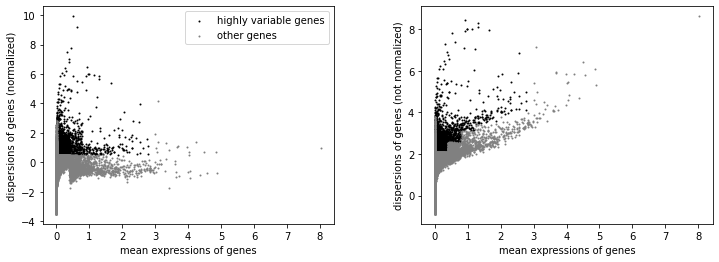

In [231]:
sc.pl.highly_variable_genes(rna_x)

In [232]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

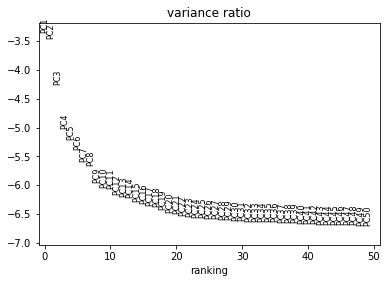

In [233]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

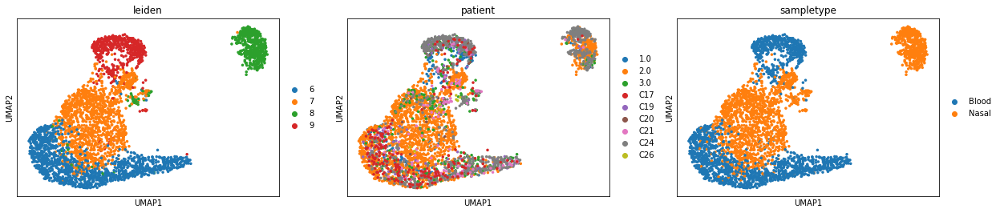

In [234]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient')
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'], size=50)

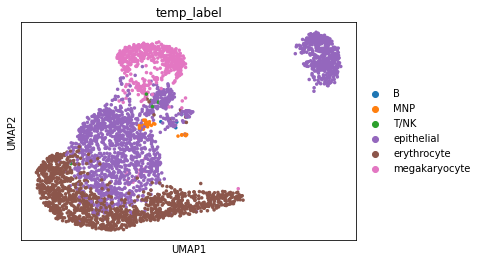

In [235]:
sc.pl.umap(rna_x, color=['temp_label'], size=50)

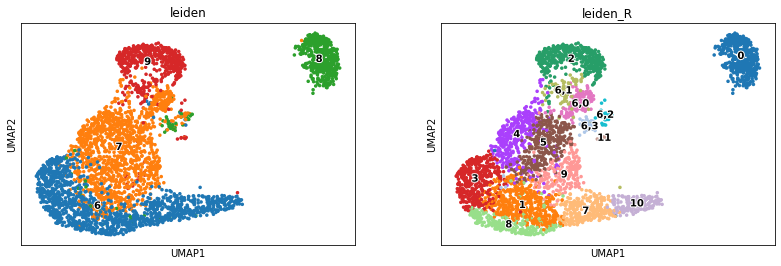

In [244]:
# find clusters
sc.tl.leiden(rna_x, resolution = 1.2, key_added = 'leiden_R')
sc.tl.leiden(rna_x, resolution = .5, key_added = 'leiden_R', restrict_to = ('leiden_R', ['6']))
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=50, legend_loc ='on data', legend_fontoutline=2)

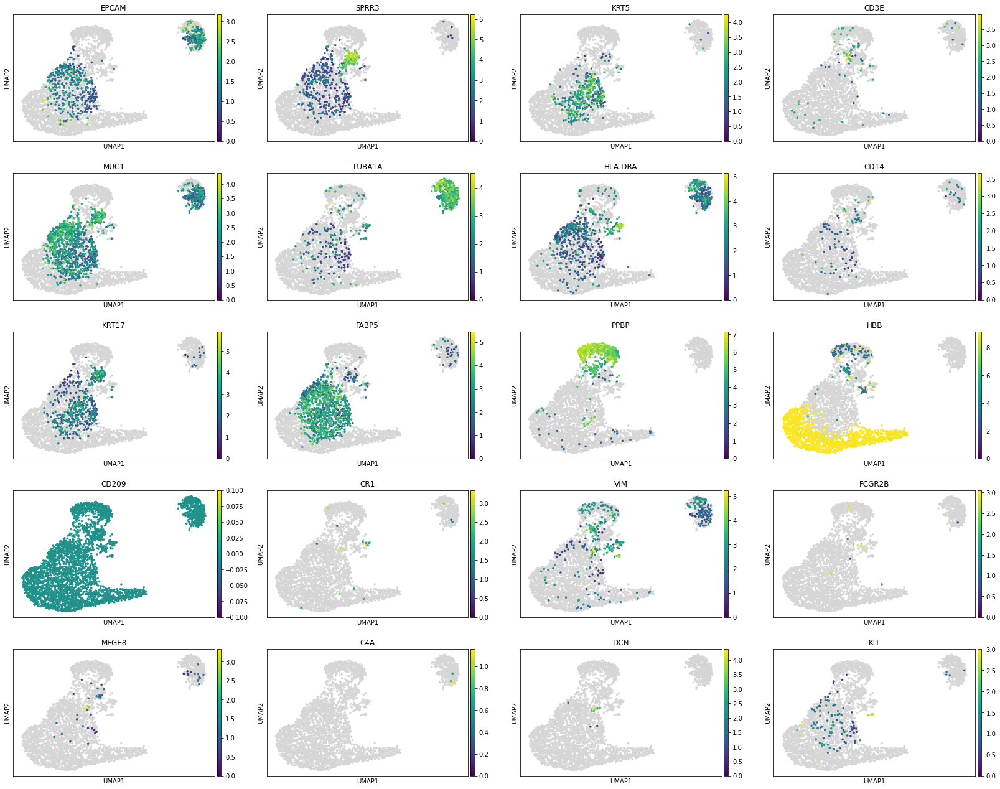

In [251]:
sc.pl.umap(rna_x, color = ['EPCAM', 'SPRR3', 'KRT5', 'CD3E', 'MUC1', 'TUBA1A', 'HLA-DRA', 'CD14', 'KRT17', 'FABP5', 'PPBP', 'HBB', 'CD209', 'CR1', 'VIM', 'FCGR2B', 'MFGE8', 'C4A', 'DCN', 'KIT'], color_map = newcmp, size = 50)

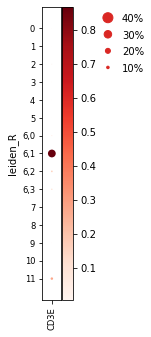

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[0.35, 0, 0.2, 0.5, 0.25])

In [252]:
sc.pl.dotplot(rna_x, ['CD3E'],groupby = 'leiden_R')

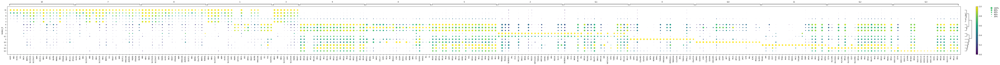

In [248]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 20, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

... storing 'temp_label' as categorical


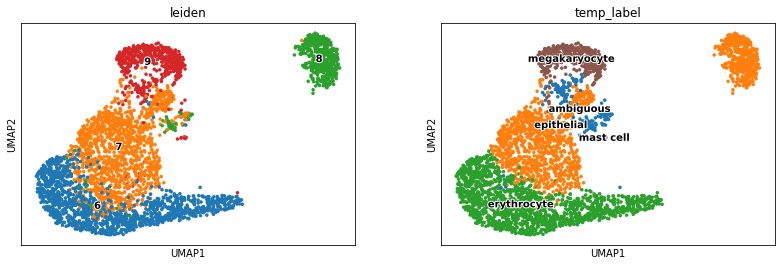

In [253]:
new_dict1 = {'0':'epithelial',
'1':'erythrocyte',
'2':'megakaryocyte',
'3':'erythrocyte',
'4':'epithelial',
'5':'epithelial',
'6,0':'epithelial',
'6,1':'ambiguous',
'6,2':'ambiguous',
'6,3':'ambiguous',
'7':'erythrocyte',
'8':'erythrocyte',
'9':'epithelial',
'10':'erythrocyte',
'11':'mast cell'}
rna_x.obs['temp_label'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'temp_label'], size=50, legend_loc ='on data', legend_fontoutline=2)

... storing 'temp_label' as categorical


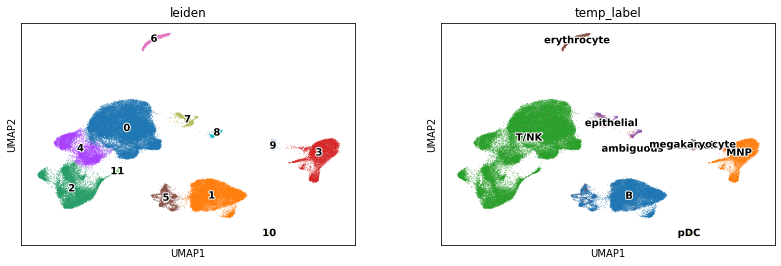

In [254]:
# update the original object
adata.obs['temp_label'] = adata.obs['temp_label'].astype('object')
adata.obs['temp_label'].update(rna_x.obs['temp_label'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'temp_label'], legend_loc = 'on data', legend_fontoutline=2)

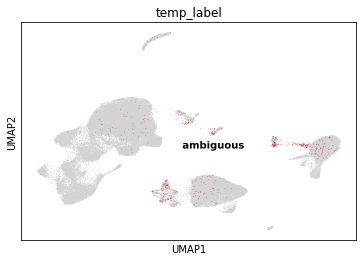

In [255]:
sc.pl.umap(adata, color = ['temp_label'], groups = 'ambiguous', legend_loc = 'on data', legend_fontoutline=2)

In [257]:
adata_ = adata.copy()
adata_

AnnData object with n_obs × n_vars = 80873 × 907
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'temp_label'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'umap', 'temp_label_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [258]:
adata = sc.read_h5ad('out/adata_combined_v2.h5ad')
adata_raw = sc.read_h5ad('out/adata_combined_raw_v2.h5ad')
adata

AnnData object with n_obs × n_vars = 93971 × 876
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'temp_label'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

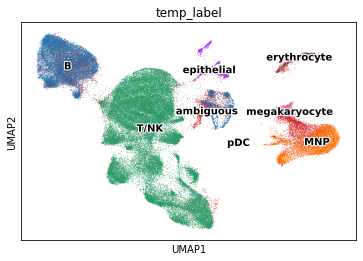

In [259]:
sc.pl.umap(adata, color = ['temp_label'], legend_loc = 'on data', legend_fontoutline=2)

In [260]:
adata.obs['temp_label'] = adata.obs['temp_label'].astype('object')
adata.obs['temp_label'].update(adata_.obs['temp_label'].astype('object'))

... storing 'temp_label' as categorical


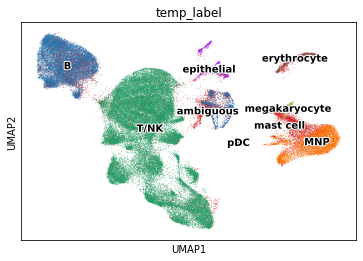

In [261]:
sc.pl.umap(adata, color = ['temp_label'], legend_loc = 'on data', legend_fontoutline=2)

In [262]:
# save the file temporarily
adata_raw.obs = adata.obs.copy() 
adata.write('out/adata_combined_v2.h5ad', compression = 'gzip')
adata_raw.write('out/adata_combined_raw_v2.h5ad', compression = 'gzip')